## Objective: Main aim of this notebook is to generate face behind the mask using autoencoder.

## Import Necessary Libraries

In [1]:
import tensorflow as tf
import tensorflow.keras as keras
from keras.layers import Dense, Conv2D, MaxPool2D, UpSampling2D, Dropout, Input
from keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm 
import numpy as np
import os
import re
from skimage.measure import compare_ssim
from scipy import ndimage
import random


In [2]:
print(tf.__version__)
print(keras.__version__)
print(np.__version__)

2.3.1
2.4.0
1.17.5


In [3]:
from keras.engine import  Model
from keras.layers import Input

In [4]:
!pip install image-quality
import imquality.brisque as brisque

     |████████████████████████████████| 146 kB 4.4 MB/s 
     |████████████████████████████████| 170 kB 16.4 MB/s 
  Created wheel for libsvm: filename=libsvm-3.23.0.4-cp37-cp37m-linux_x86_64.whl size=244146 sha256=341445afbd3140feb539f36f7998a9014c2909c1ff2d6154896057e8e41b9d73
  Stored in directory: /root/.cache/pip/wheels/cd/e8/1e/bf95cf256e4d3ffc94289ab508c49d48e34c98220af63e3513
Successfully built libsvm
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


## Load data
Here I am going to load only ~1000 images each with mask and no mask (we tested it on kaggle with limited resources). These images are converted to an array and are appended in empty array. Here I also have defind function to load data serially. 

In [5]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)


# defining the size of image 
SIZE = 256

mask_path = '../input/face-mask-lite-dataset/with_mask'
mask_array = []

image_path = '../input/face-mask-lite-dataset/without_mask'
img_array = []

image_file = sorted_alphanumeric(os.listdir(image_path))
mask_file = sorted_alphanumeric(os.listdir(mask_path))

        
for i in tqdm(image_file):
 
    if i == 'seed1000.png':
        break
    
    else:
        image = cv2.imread(image_path + '/' + i,1)

        # as opencv load image in bgr format converting it to rgb
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # resizing images 
        image = cv2.resize(image, (SIZE, SIZE))

        # normalizing image 
        image = image.astype('float32') / 255.0
        # appending normal sketch image
        img_array.append(img_to_array(image))
    

 10%|█         | 1000/10000 [00:55<08:23, 17.86it/s]


In [6]:
for i in tqdm(mask_file):
    if i == 'with-mask-default-mask-seed1000.png':
        break
    else:    
        image = cv2.imread(mask_path + '/' + i,1)

          # as opencv load image in bgr format converting it to rgb
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # resizing images 
        image = cv2.resize(image, (SIZE, SIZE))

        # normalizing image 
        image = image.astype('float32') / 255.0

        #appending normal normal image    
        mask_array.append(img_to_array(image))

 10%|█         | 1000/10000 [00:52<07:55, 18.92it/s]


## Plot image pair

## Slicing and reshaping
Here i have used 2300 images for training and remaining 200 for testing.

In [7]:
n = int(len(mask_array)*0.8)
train_mask_image = mask_array[:n]
train_image = img_array[:n]
test_mask_image = mask_array[n:]
test_image = img_array[n:]

# reshaping
train_mask_image = np.reshape(train_mask_image,(len(train_mask_image),SIZE,SIZE,3))
train_image = np.reshape(train_image, (len(train_image),SIZE,SIZE,3))
print('Train no mask image shape:',train_image.shape)
test_mask_image = np.reshape(test_mask_image,(len(test_mask_image),SIZE,SIZE,3))
test_image = np.reshape(test_image, (len(test_image),SIZE,SIZE,3))
print('Test no mask image shape',test_image.shape)

Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)


In [8]:
if 0:
    mask_region = [i==r for (i,r) in zip(mask_array, img_array)]

    mask_region = [tf.reduce_all(x,axis=2) for x in mask_region]
    mask_region = [tf.stack([tf.logical_not(x),x],axis=2) for x in mask_region]
    mask_region_float = tf.reshape([tf.reshape(m,(SIZE,SIZE,2)) for m in mask_region], (len(mask_region),SIZE,SIZE,2))


    print(img_array[0][:,:,1] - tf.cast(mask_region_float[0,:,:,1],dtype='float'))
    plt.imshow(img_array[0][:,:,0] -  tf.cast(mask_region_float[0,:,:,1],dtype='float'))
    plt.show()
    print(mask_region_float.shape)

image editing

In [9]:
def blurImage(im):
    k = random.randint(1,3)
    k = k * 2 + 1
    res = cv2.GaussianBlur(im,(k,k),0)
    return res

def medFilt(im):
    res = np.uint8(im*256)
    res = cv2.medianBlur(res,5)
    return res

def rotImage(im):   
    #rotation angle in degree
    (h, w) = im.shape[:2]
    (cX, cY) = (w // 2, h // 2)
    deg = random.random() - 0.5
    isflip = random.random()
    M = cv2.getRotationMatrix2D((cX, cY), 20*deg, 1.0)
    res = cv2.warpAffine(im, M, (w, h))
    
    if isflip>0.5:
        res = flipImage(res)
    return res

def flipImage(im):
    res = np.fliplr(im)
    return res

def saltPImage(im):
    (h, w) = image.shape[:2]
    sc = random.random()
    m = np.random.normal(scale=sc/2,size = (h,w,3))
    res = im + m
    return res

def shotNoise(im):
    (h, w) = image.shape[:2]
    rng = np.random.default_rng()
    sc = random.random() / 10
    s = rng.poisson(sc, (h,w,3)) - sc
    res = im + s
    return res

def darkenIm(im):
    factor = random.random()
    res = im * (0.5+factor/2)
    return res

def brightenIm(im):
    factor = random.random()
    factor = factor / 2 + 0.5
    res = im / factor
    return res

def changeColour(im):
    order = np.random.permutation(range(3))
    res = im[:,:,[order[0], order[1], order[2]]]
    return res

def edit_images(mask_array):
    mask_array_edit = mask_array.copy()
    for iter in range(3):
        for ind in tqdm(range(len(mask_array))):
            im = mask_array_edit[ind]
            alg = random.random()
            if alg < 0.1:
                res = im
            elif alg < 0.2 and alg > 0.1:
                res = blurImage(im)
                res = im
            elif alg < 0.3 and alg > 0.2:
                # res = medFilt(im)
                res = im
            elif alg < 0.4 and alg > 0.3:
                res = rotImage(im)
            elif alg < 0.5 and alg > 0.4:
                res = saltPImage(im)
            elif alg < 0.6 and alg > 0.5:
                res = changeColour(im)
            elif alg < 0.7 and alg > 0.6:
                res = darkenIm(im)
            elif alg < 0.8 and alg > 0.7:
                res = shotNoise(im)
            elif alg < 0.9 and alg > 0.8:
                res = im
                res = brightenIm(im)
            else:
                res = flipImage(im)
            mask_array_edit[ind] = res
    n = int(np.round(len(mask_array_edit)*0.8))
    mask_array_edit_tr = mask_array_edit[:n]
    mask_array_edit_te = mask_array_edit[n:]

    mask_array_edit_tr = np.reshape(mask_array_edit_tr,(len(mask_array_edit_tr),SIZE,SIZE,3))
    print('Train no mask image shape:',mask_array_edit_tr.shape)

    mask_array_edit_te = np.reshape(mask_array_edit_te,(len(mask_array_edit_te),SIZE,SIZE,3))
    print('Test no mask image shape',mask_array_edit_te.shape)
    return mask_array_edit_tr,mask_array_edit_te, mask_array_edit

mask_array_edit_tr,mask_array_edit_te, mask_array_edit = edit_images(mask_array)

100%|██████████| 1000/1000 [00:02<00:00, 394.81it/s]


Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)


In [10]:
def plot_image_pair(images = 5):
    for i in range(images):
        plt.figure(figsize = (7,7))
        plt.subplot(1,3,1)
        plt.title("No Mask", fontsize = 15)
        plt.imshow(img_array[i].reshape(SIZE, SIZE, 3))
        plt.subplot(1,3,2)
        plt.title("Mask", fontsize = 15)
        plt.imshow(mask_array[i].reshape(SIZE, SIZE, 3))
        plt.subplot(1,3,3)
        plt.title("Mask", fontsize = 15)
        plt.imshow(mask_array_edit[i].reshape(SIZE, SIZE, 3))


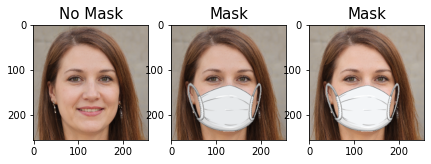

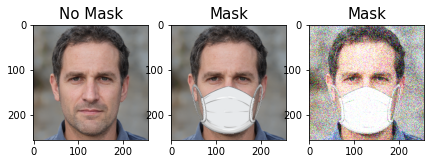

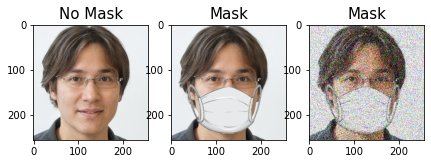

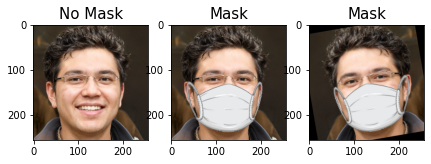

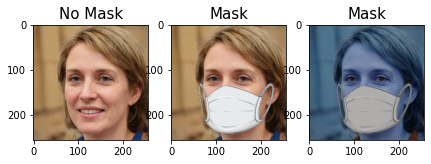

...

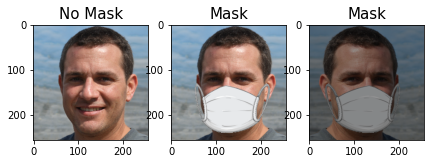

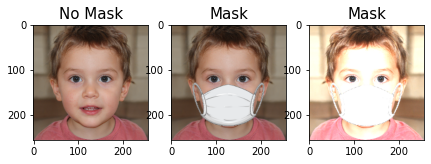

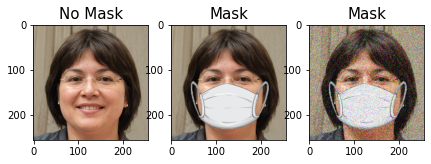

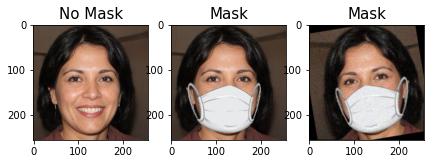

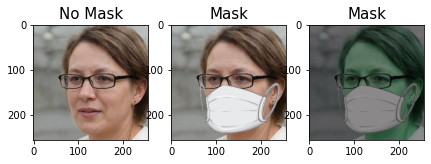

In [11]:
plot_image_pair(20)

## Defining our model

In [12]:
encoder_input = keras.Input(shape=(SIZE,SIZE, 3), name="img")
x = Conv2D(filters = 16, kernel_size = (3,3), activation = 'relu', padding = 'same')(encoder_input)
x = MaxPool2D(pool_size = (2,2))(x)

x = Conv2D(filters = 32,kernel_size = (3,3),strides = (2,2), activation = 'relu', padding = 'valid')(x)
x = Conv2D(filters = 64, kernel_size = (3,3), strides = (2,2), activation = 'relu', padding = 'same')(x)
x = MaxPool2D(pool_size = (2,2))(x)

x = Conv2D(filters = 64, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = Conv2D(filters = 128, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = Conv2D(filters = 128 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x) 
x = Conv2D(filters = 256 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x) 
encoder_output = Conv2D(filters = 512 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x) 
encoder = tf.keras.Model(encoder_input, encoder_output)

decoder_input = Conv2D(filters = 512 ,kernel_size = (3,3), activation = 'relu', padding = 'same')(encoder_output)
x = UpSampling2D(size = (2,2))(decoder_input)
x = Conv2D(filters = 256, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = Conv2D(filters = 128, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = Conv2D(filters = 128, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = Conv2D(filters = 164, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = UpSampling2D(size = (2,2) )(x)

x = Conv2D(filters = 64, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = UpSampling2D(size = (2,2) )(x)
x = Conv2D(filters = 32 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = UpSampling2D(size = (2,2) )(x)
 
x = Conv2D(filters = 16  , kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
decoder_output = Conv2D(filters = 3, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)

# final model
model = keras.Model(encoder_input, decoder_output)
model.summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
img (InputLayer)             [(None, 256, 256, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 256, 256, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 63, 63, 32)        4640      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 64)       

FOR GAN: defining our descriminator:

## Compiling our model

In [13]:
# create a loss
def myLoss(im,ref):
    mse = keras.losses.mean_squared_error(im,ref)
    score = tf.image.ssim_multiscale(im, ref,1,filter_sigma=0.75)
    return tf.reduce_mean(mse) * (tf.abs(1-score[0]))

In [14]:
tf.shape(train_image)
#prediction = maskModel.predict(mask_array[0].reshape(1,SIZE, SIZE, 3))
#plt.imshow(np.squeeze(prediction))


<tf.Tensor: shape=(4,), dtype=int32, numpy=array([800, 256, 256,   3], dtype=int32)>

(256, 256, 3)


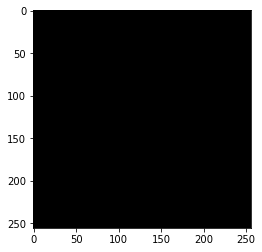

In [15]:
    print(train_image[0].shape) 
    prediction = model.predict(tf.reshape(train_image[1],(-1,256,256,3)))
    plt.imshow(tf.squeeze(prediction))
    plt.show()

In [16]:
print(train_image.dtype)
def plot_images(start = 0, end = 5):
    #  os.mkdir('/kaggle/working/comps')
    for i in range(start, end, 1):
        plt.figure(figsize = (10,10))
        plt.subplot(1,3,1)
        plt.title("No Mask", fontsize = 12)
        plt.imshow(test_image[i])
        plt.subplot(1,3,2)
        plt.title("Mask", fontsize = 12)
        plt.imshow(mask_array_edit_te[i])
        plt.subplot(1,3,3)
        plt.title("Predicted", fontsize = 12)
        prediction = model.predict(tf.reshape(tf.keras.backend.constant(mask_array_edit_te[i]),
                                              (-1,256,256,3)))
        plt.imshow(tf.squeeze(prediction))
        
        #  plt.savefig('comps'+os.sep+'test img:'+str(i)+'.tiff')
        plt.show()
        

float32


100%|██████████| 1000/1000 [00:01<00:00, 635.43it/s]


Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)
Epoch 1/15
20/20 [==============================] - 3s 154ms/step - loss: 0.6363 - acc: 0.4723 - val_loss: 0.1018 - val_acc: 0.8690
Epoch 2/15
20/20 [==============================] - 3s 135ms/step - loss: 0.0695 - acc: 0.8579 - val_loss: 0.0544 - val_acc: 0.8620
Epoch 3/15
20/20 [==============================] - 3s 134ms/step - loss: 0.0534 - acc: 0.8520 - val_loss: 0.0514 - val_acc: 0.8620
Epoch 4/15
20/20 [==============================] - 3s 135ms/step - loss: 0.0522 - acc: 0.8531 - val_loss: 0.0497 - val_acc: 0.8621
Epoch 5/15
20/20 [==============================] - 3s 134ms/step - loss: 0.0473 - acc: 0.8531 - val_loss: 0.0427 - val_acc: 0.8610
Epoch 6/15
20/20 [==============================] - 3s 132ms/step - loss: 0.0405 - acc: 0.8521 - val_loss: 0.0400 - val_acc: 0.8627
Epoch 7/15
20/20 [==============================] - 3s 135ms/step - loss: 0.0335 - acc: 0.8545 - val_loss: 0.0311 - va

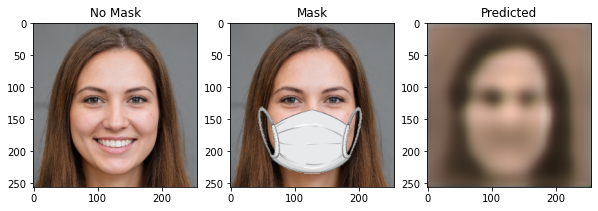

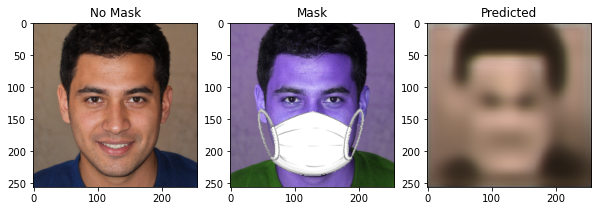

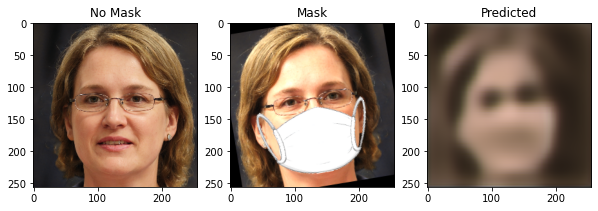

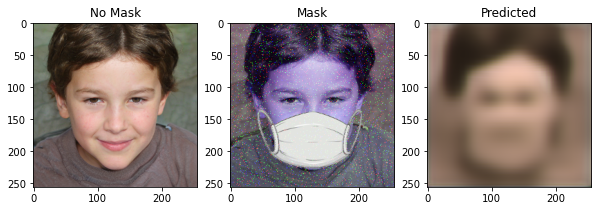

7/7 [==============================] - 0s 67ms/step - loss: 0.0226 - acc: 0.8640


  8%|▊         | 82/1000 [00:00<00:01, 779.50it/s]

test loss, test acc: [0.022570816799998283, 0.8640129566192627]
----0-----


100%|██████████| 1000/1000 [00:01<00:00, 637.39it/s]


Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)
Epoch 1/15
20/20 [==============================] - 3s 140ms/step - loss: 0.0233 - acc: 0.8593 - val_loss: 0.0225 - val_acc: 0.8690
Epoch 2/15
20/20 [==============================] - 3s 132ms/step - loss: 0.0221 - acc: 0.8601 - val_loss: 0.0225 - val_acc: 0.8696
Epoch 3/15
20/20 [==============================] - 3s 132ms/step - loss: 0.0218 - acc: 0.8603 - val_loss: 0.0227 - val_acc: 0.8692
Epoch 4/15
20/20 [==============================] - 3s 134ms/step - loss: 0.0212 - acc: 0.8602 - val_loss: 0.0220 - val_acc: 0.8670
Epoch 5/15
20/20 [==============================] - 3s 140ms/step - loss: 0.0205 - acc: 0.8604 - val_loss: 0.0209 - val_acc: 0.8685
Epoch 6/15
20/20 [==============================] - 3s 132ms/step - loss: 0.0202 - acc: 0.8597 - val_loss: 0.0209 - val_acc: 0.8651
Epoch 7/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0207 - acc: 0.8598 - val_loss: 0.0222 - va

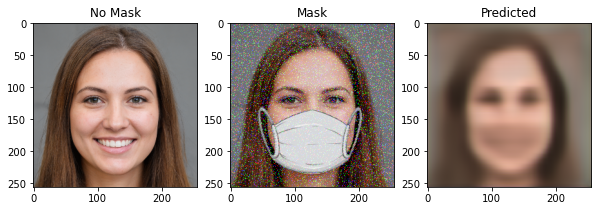

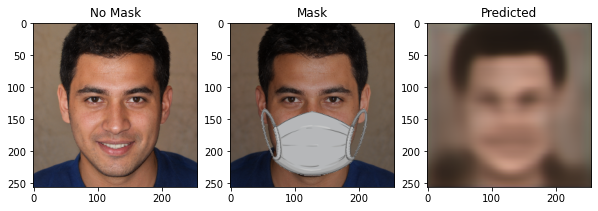

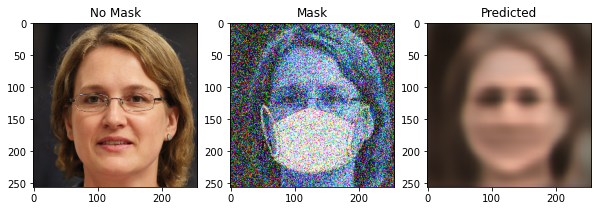

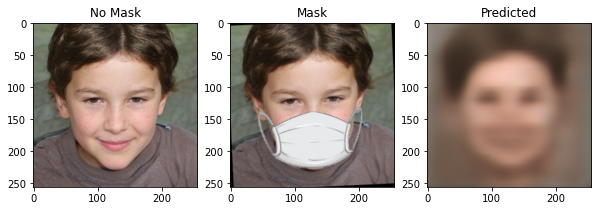

7/7 [==============================] - 0s 38ms/step - loss: 0.0188 - acc: 0.8616


  0%|          | 0/1000 [00:00<?, ?it/s]

test loss, test acc: [0.018764570355415344, 0.8615837097167969]
----1-----


100%|██████████| 1000/1000 [00:01<00:00, 620.37it/s]


Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)
Epoch 1/15
20/20 [==============================] - 3s 146ms/step - loss: 0.0193 - acc: 0.8520 - val_loss: 0.0195 - val_acc: 0.8685
Epoch 2/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0188 - acc: 0.8543 - val_loss: 0.0192 - val_acc: 0.8569
Epoch 3/15
20/20 [==============================] - 3s 134ms/step - loss: 0.0188 - acc: 0.8522 - val_loss: 0.0191 - val_acc: 0.8609
Epoch 4/15
20/20 [==============================] - 3s 137ms/step - loss: 0.0179 - acc: 0.8526 - val_loss: 0.0183 - val_acc: 0.8566
Epoch 5/15
20/20 [==============================] - 3s 134ms/step - loss: 0.0177 - acc: 0.8507 - val_loss: 0.0197 - val_acc: 0.8675
Epoch 6/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0174 - acc: 0.8534 - val_loss: 0.0191 - val_acc: 0.8625
Epoch 7/15
20/20 [==============================] - 3s 135ms/step - loss: 0.0173 - acc: 0.8564 - val_loss: 0.0191 - va

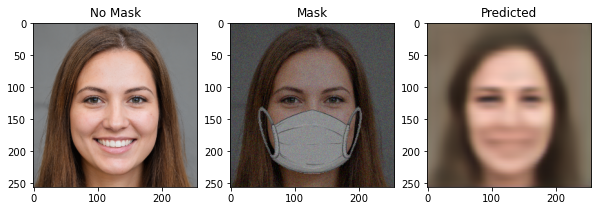

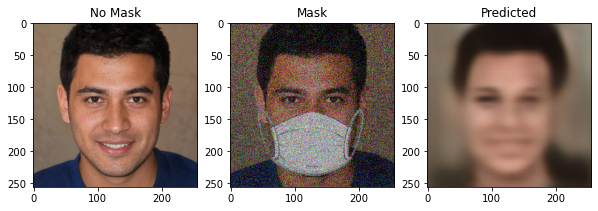

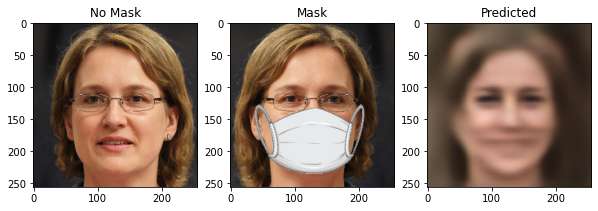

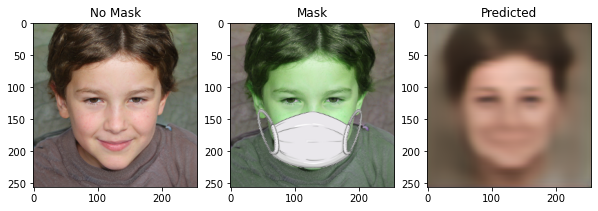

7/7 [==============================] - 0s 40ms/step - loss: 0.0190 - acc: 0.8599


  0%|          | 0/1000 [00:00<?, ?it/s]

test loss, test acc: [0.01899034157395363, 0.859910249710083]
----2-----


100%|██████████| 1000/1000 [00:01<00:00, 604.26it/s]


Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)
Epoch 1/15
20/20 [==============================] - 3s 141ms/step - loss: 0.0189 - acc: 0.8545 - val_loss: 0.0178 - val_acc: 0.8693
Epoch 2/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0180 - acc: 0.8561 - val_loss: 0.0170 - val_acc: 0.8679
Epoch 3/15
20/20 [==============================] - 3s 131ms/step - loss: 0.0171 - acc: 0.8561 - val_loss: 0.0169 - val_acc: 0.8565
Epoch 4/15
20/20 [==============================] - 3s 135ms/step - loss: 0.0169 - acc: 0.8552 - val_loss: 0.0174 - val_acc: 0.8638
Epoch 5/15
20/20 [==============================] - 3s 135ms/step - loss: 0.0166 - acc: 0.8558 - val_loss: 0.0166 - val_acc: 0.8490
Epoch 6/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0160 - acc: 0.8562 - val_loss: 0.0168 - val_acc: 0.8649
Epoch 7/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0157 - acc: 0.8546 - val_loss: 0.0177 - va

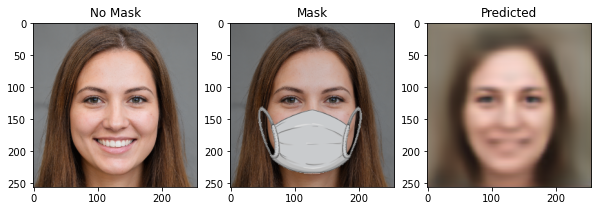

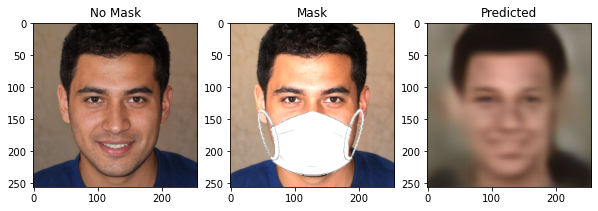

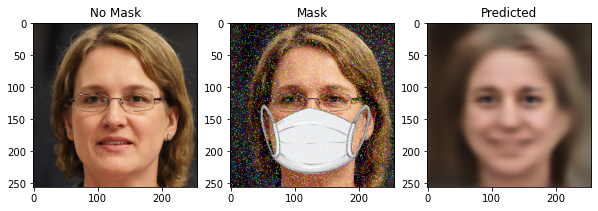

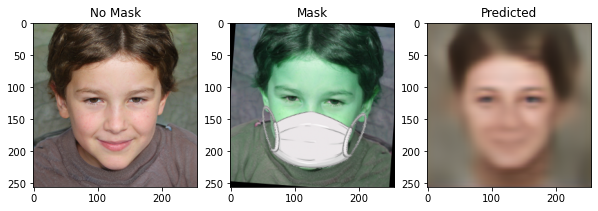

7/7 [==============================] - 0s 39ms/step - loss: 0.0174 - acc: 0.8497


  0%|          | 0/1000 [00:00<?, ?it/s]

test loss, test acc: [0.017362944781780243, 0.8496723175048828]
----3-----


100%|██████████| 1000/1000 [00:01<00:00, 570.99it/s]


Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)
Epoch 1/15
20/20 [==============================] - 3s 146ms/step - loss: 0.0170 - acc: 0.8561 - val_loss: 0.0197 - val_acc: 0.8627
Epoch 2/15
20/20 [==============================] - 3s 141ms/step - loss: 0.0168 - acc: 0.8553 - val_loss: 0.0191 - val_acc: 0.8646
Epoch 3/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0154 - acc: 0.8590 - val_loss: 0.0183 - val_acc: 0.8661
Epoch 4/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0150 - acc: 0.8588 - val_loss: 0.0184 - val_acc: 0.8676
Epoch 5/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0145 - acc: 0.8569 - val_loss: 0.0183 - val_acc: 0.8674
Epoch 6/15
20/20 [==============================] - 3s 134ms/step - loss: 0.0140 - acc: 0.8596 - val_loss: 0.0184 - val_acc: 0.8568
Epoch 7/15
20/20 [==============================] - 3s 135ms/step - loss: 0.0137 - acc: 0.8558 - val_loss: 0.0187 - va

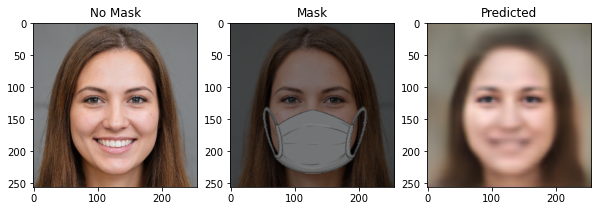

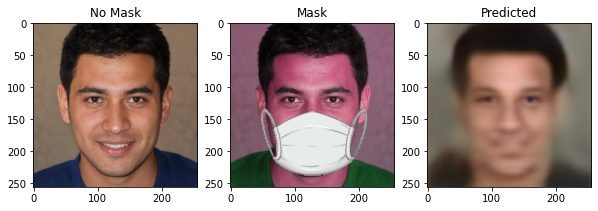

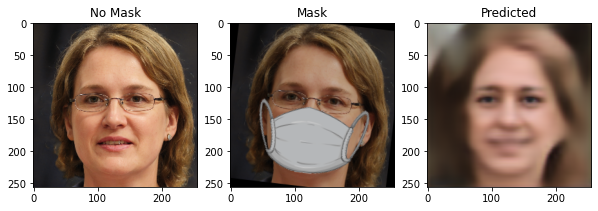

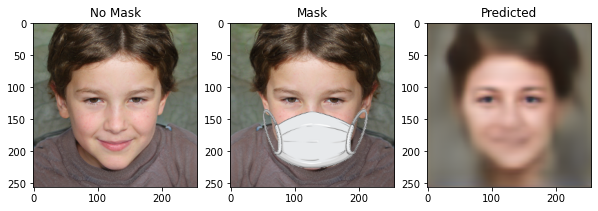

7/7 [==============================] - 0s 37ms/step - loss: 0.0181 - acc: 0.8390
test loss, test acc: [0.01810968853533268, 0.8390408158302307]
----4-----


In [17]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mse',
              metrics = ['acc'])
results=[]

for iter in range(5):
    mask_array_edit_tr,mask_array_edit_te,mask_array_edit = edit_images(mask_array)
    model.fit(mask_array_edit_tr, train_image, epochs = 15,shuffle='True',validation_split = 0.2)
    plot_images(21,25)
    results.append(model.evaluate(mask_array_edit_te, test_image, batch_size=32))
    print("test loss, test acc:", results[iter])
    print("----"+str(iter)+"-----")

## Model evaluation

In [18]:
loss_acc= model.evaluate(test_mask_image, test_image)
print("Loss: ",loss_acc[0])
print('Accuracy: ', np.round(loss_acc[1],2) * 100)

7/7 [==============================] - 0s 42ms/step - loss: 0.0115 - acc: 0.8439
Loss:  0.011488940566778183
Accuracy:  84.0


**discriminator**

In [19]:
from keras.applications.vgg16 import VGG16
vgg_disc = VGG16(include_top=0,input_shape=(256,256,3),classes=1000) # real, fake
print(vgg_disc.summary())


58892288/58889256 [==============================] - 0s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
______________________________________________________________

In [20]:
vgg_out_shape = (8,8,512)

for layer in vgg_disc.layers[:]:
    layer.trainable = False
    
discriminator = keras.Sequential()

# Add the vgg convolutional base model
discriminator.add(vgg_disc)
# Add new layers
discriminator.add(keras.layers.Flatten())
discriminator.add(Dense(128, activation='relu'))
discriminator.add(Dropout(0.5))
discriminator.add(Dense(2, activation='softmax'))
# Show a summary of the model. Check the number of trainable parameters
discriminator.summary()

discriminator.compile(loss='mae',
              optimizer=keras.optimizers.Adam(lr=1e-6),
              metrics=['acc'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 8, 8, 512)         14714688  
_________________________________________________________________
flatten (Flatten)            (None, 32768)             0         
_________________________________________________________________
dense (Dense)                (None, 128)               4194432   
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 258       
Total params: 18,909,378
Trainable params: 4,194,690
Non-trainable params: 14,714,688
_________________________________________________________________


In [21]:
from keras.applications.vgg16 import preprocess_input
# prepare the image for the VGG model
im = tf.reshape(preprocess_input(train_image[0]),(-1,256,256,3))

yhat = discriminator.predict(im)
print(yhat)

[[0.90006834 0.0999317 ]]


training of discriminator

In [22]:
print(len(mask_array_edit))

1000


In [23]:
gen_images = np.zeros((len(mask_array_edit),SIZE,SIZE,3))
for i in tqdm(range(len(mask_array_edit))):
    gen_images[i,:,:,:] = np.reshape(model.predict(tf.reshape(mask_array_edit[i],
                                                              (1,SIZE,SIZE,3))),(1,SIZE,SIZE,3))       

gen_images = tf.Variable(gen_images)

100%|██████████| 1000/1000 [00:38<00:00, 25.93it/s]


In [24]:
train_ims_tf = tf.Variable(np.reshape(train_image,(-1,256,256,3)))

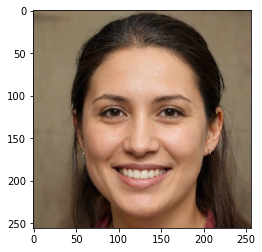

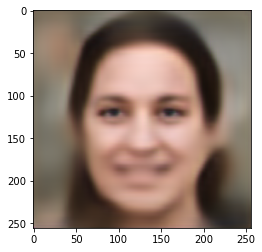

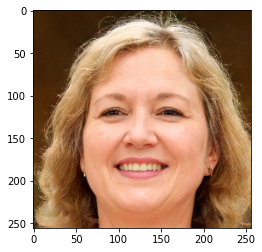

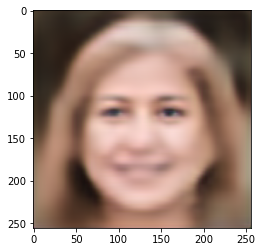

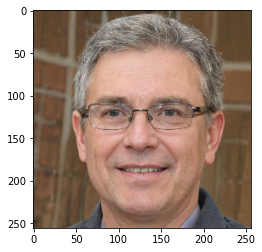

...

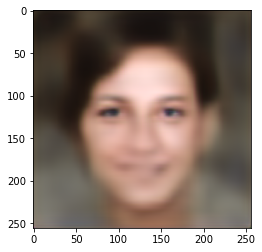

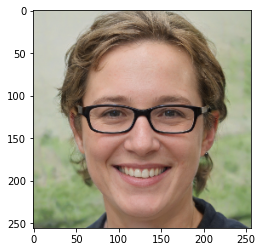

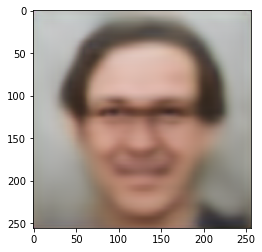

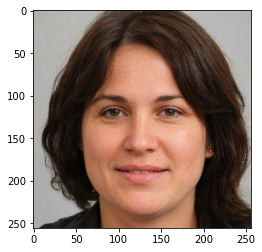

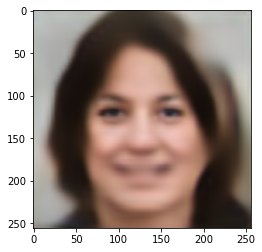

In [25]:
for i in range(10):
    plt.imshow(test_image[i])
    plt.show()
    plt.imshow(gen_images[len(train_image) + i])
    plt.show()

In [26]:
print(tf.shape(gen_images))
print(tf.shape(train_ims_tf)) # list of tensors

tf.Tensor([1000  256  256    3], shape=(4,), dtype=int32)
tf.Tensor([800 256 256   3], shape=(4,), dtype=int32)


In [27]:
disc_data = tf.concat([tf.cast(gen_images,dtype='float32'), tf.cast(train_ims_tf,dtype='float32')],0)
print(tf.shape(disc_data))
nims = tf.shape(gen_images)[0]
nims2 = tf.shape(train_ims_tf)[0]

disc_tags = tf.concat([tf.concat([tf.zeros((nims,1),dtype='int32'),tf.ones((nims,1),dtype='int32')],1), 
             tf.concat([tf.ones((nims2,1),dtype='int32'),tf.zeros((nims2,1),dtype='int32')],1)],0)
print(disc_tags[0])
print(disc_tags[1500])
print(tf.shape(disc_tags))

tf.Tensor([1800  256  256    3], shape=(4,), dtype=int32)
tf.Tensor([0 1], shape=(2,), dtype=int32)
tf.Tensor([1 0], shape=(2,), dtype=int32)
tf.Tensor([1800    2], shape=(2,), dtype=int32)


In [28]:
discriminator.fit(disc_data, disc_tags,batch_size=64,epochs=10, validation_split = 0.2,shuffle='True')

Epoch 1/10
23/23 [==============================] - 6s 269ms/step - loss: 0.4255 - acc: 0.6181 - val_loss: 0.6646 - val_acc: 0.0167
Epoch 2/10
23/23 [==============================] - 4s 188ms/step - loss: 0.3443 - acc: 0.7285 - val_loss: 0.6748 - val_acc: 0.0167
Epoch 3/10
23/23 [==============================] - 4s 188ms/step - loss: 0.2958 - acc: 0.7569 - val_loss: 0.6277 - val_acc: 0.0722
Epoch 4/10
23/23 [==============================] - 4s 190ms/step - loss: 0.2662 - acc: 0.7819 - val_loss: 0.5346 - val_acc: 0.3278
Epoch 5/10
23/23 [==============================] - 4s 187ms/step - loss: 0.2174 - acc: 0.8521 - val_loss: 0.3846 - val_acc: 0.9028
Epoch 6/10
23/23 [==============================] - 4s 193ms/step - loss: 0.1799 - acc: 0.8917 - val_loss: 0.2504 - val_acc: 1.0000
Epoch 7/10
23/23 [==============================] - 4s 188ms/step - loss: 0.1453 - acc: 0.9382 - val_loss: 0.1823 - val_acc: 1.0000
Epoch 8/10
23/23 [==============================] - 4s 189ms/step - loss: 0.

Test the discriminator

In [29]:
preds = []
for i in tqdm(range(tf.shape(gen_images)[0])):
    preds.append(discriminator(tf.reshape(gen_images[i],(-1,256,256,3))))



100%|██████████| 1000/1000 [00:06<00:00, 158.82it/s]


[450 421 201 869]


/opt/conda/lib/python3.7/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


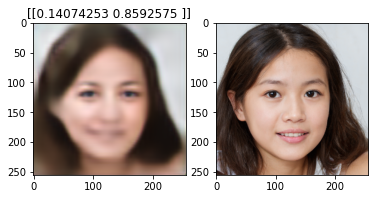

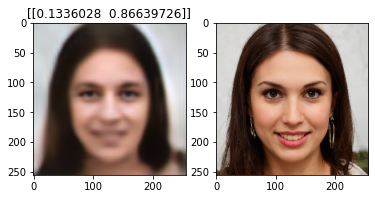

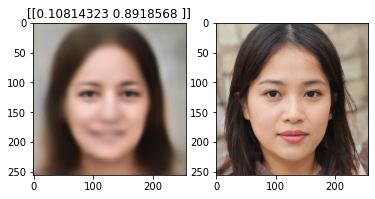

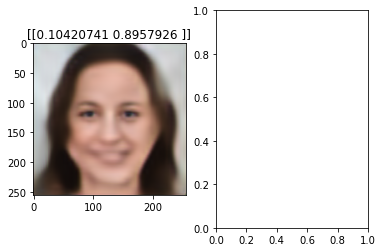

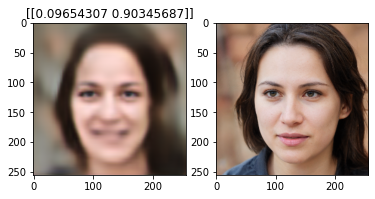

...

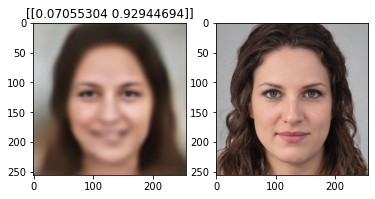

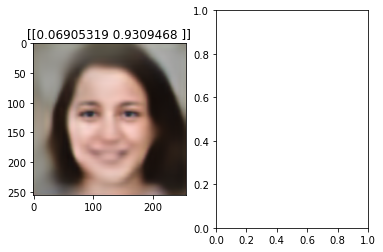

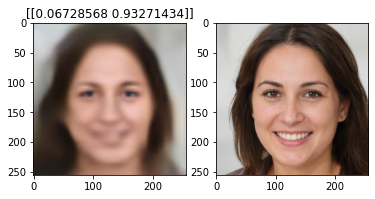

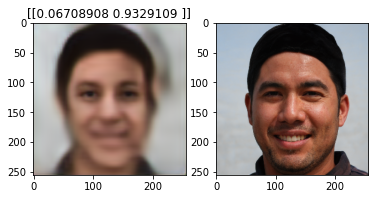

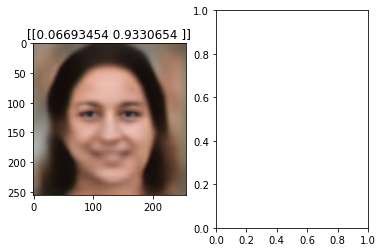

In [30]:
preds = np.asarray(preds)
vals = np.argsort(-preds[:,0][:,0])
print(vals[0:4])

for iter in range(20):
    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(gen_images[vals[iter]])
    plt.title(preds[vals[iter]])
    plt.subplot(1,2,2)
    if vals[iter] < len(train_image):
        plt.imshow(train_image[vals[iter]])
        plt.show()

finally, train our model with discriminator as loss

In [31]:
def discLoss(img,truth):
    res1 = discriminator(img)
    res2 = discriminator(truth)
    res3 = keras.losses.MSE(img,truth)
    return tf.norm(res1-res2)*0.2 + res3*0.8

In [32]:
def brisqueLoss(img, truth):
    res1 = brisque.score(tf.make_ndarray(img))
    res2 = brisque.score(tf.make_ndarray(truth))
    res3 = keras.losses.MSE(img,truth)
    return abs(res1-res2)*0.2 + res3*0.8

In [33]:
def ssimLoss(img,truth):
    res1 = tf.image.ssim_multiscale(img,truth,255)
    res3 = keras.losses.MSE(img,truth)
    return 1e3*(1-res1)*0.2 + res3*0.8

In [34]:
def psnrLoss(img,truth):
    res1 = tf.image.psnr(img,truth,255)
    res2 = tf.image.ssim_multiscale(img,truth,255)
    return 10/res1*0.2 + 1e3*(1-res2)

In [35]:
for layer in discriminator.layers[:]:
    layer.trainable = False

try to train a new generator

In [36]:
from copy import copy
editor = copy(model)


In [37]:
editor.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-5), 
               loss = 'mse', metrics = ['acc']) 
gen_train = np.array(gen_images[0:500]) 
train_ims_tf2 = np.array(train_ims_tf[0:500])
editor.fit(gen_train, train_ims_tf2, epochs = 5,validation_split = 0.2,shuffle='True')

Epoch 1/5
13/13 [==============================] - 3s 227ms/step - loss: 33.1836 - acc: 0.8296 - val_loss: 0.0212 - val_acc: 0.8625
Epoch 2/5
13/13 [==============================] - 2s 131ms/step - loss: 33.1467 - acc: 0.8388 - val_loss: 0.0176 - val_acc: 0.8692
Epoch 3/5
13/13 [==============================] - 2s 126ms/step - loss: 33.1263 - acc: 0.8449 - val_loss: 0.0165 - val_acc: 0.8726
Epoch 4/5
13/13 [==============================] - 2s 125ms/step - loss: 33.1061 - acc: 0.8470 - val_loss: 0.0166 - val_acc: 0.8744
Epoch 5/5
13/13 [==============================] - 2s 128ms/step - loss: 33.0953 - acc: 0.8488 - val_loss: 0.0179 - val_acc: 0.8759


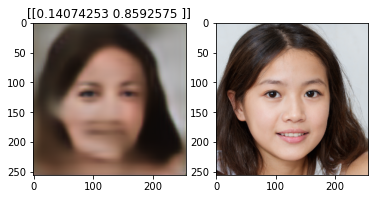

tf.Tensor(
[[[[0.29529637 0.4248147  0.33907896]
   [0.42766064 0.42211157 0.38306606]
   [0.46643153 0.42554903 0.42542335]
   ...
   [0.6092762  0.6164005  0.56547993]
   [0.59900016 0.59538573 0.5419234 ]
   [0.6126413  0.29163122 0.45811388]]

  [[0.4365112  0.4686302  0.37081605]
   [0.5196826  0.45820698 0.42658624]
   [0.533287   0.45013288 0.44379634]
   ...
   [0.5944509  0.578579   0.5701621 ]
   [0.59737456 0.61321235 0.5737147 ]
   [0.6110934  0.4768258  0.5616536 ]]

  [[0.47079322 0.43619674 0.394479  ]
   [0.51940864 0.45408827 0.41097632]
   [0.51416606 0.43181315 0.4507906 ]
   ...
   [0.6439609  0.6162721  0.62142724]
   [0.6223975  0.6459823  0.6063341 ]
   [0.6060612  0.5998322  0.57490206]]

  ...

  [[0.4682495  0.39796108 0.31930926]
   [0.51197857 0.40082377 0.35169518]
   [0.50701934 0.40413404 0.34331867]
   ...
   [0.6390389  0.5226889  0.5331898 ]
   [0.60781103 0.5177173  0.5134368 ]
   [0.527528   0.4763428  0.42004567]]

  [[0.46641946 0.3087105  0.335095

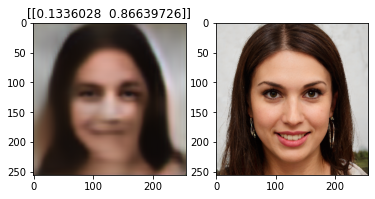

tf.Tensor(
[[[[0.37171718 0.55172306 0.46315417]
   [0.53112036 0.5515229  0.5289161 ]
   [0.5798112  0.5503494  0.57793057]
   ...
   [0.4709746  0.46459305 0.4092017 ]
   [0.4627726  0.45478502 0.39125788]
   [0.47621062 0.23345159 0.33626762]]

  [[0.5554466  0.59397113 0.5054727 ]
   [0.6411555  0.5892814  0.5888621 ]
   [0.6498805  0.5625453  0.6081392 ]
   ...
   [0.4759323  0.44525975 0.4064142 ]
   [0.4910749  0.4709484  0.41020247]
   [0.48909837 0.36746305 0.41657194]]

  [[0.5980474  0.5409583  0.5233732 ]
   [0.6345296  0.5759714  0.556968  ]
   [0.6189     0.5480892  0.606477  ]
   ...
   [0.5026617  0.46062082 0.44141257]
   [0.4947481  0.48966852 0.42997453]
   [0.4865921  0.452048   0.42382973]]

  ...

  [[0.4186425  0.32819262 0.2841536 ]
   [0.4347984  0.34028903 0.32353857]
   [0.40338695 0.3452153  0.3015758 ]
   ...
   [0.53761417 0.4196264  0.40730077]
   [0.5054984  0.41322458 0.39294115]
   [0.43459508 0.35629153 0.3207915 ]]

  [[0.39412507 0.25499523 0.281036

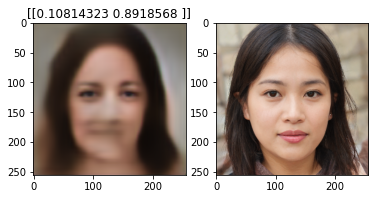

tf.Tensor(
[[[[0.2940928  0.4239328  0.33552417]
   [0.4245394  0.41951087 0.37686977]
   [0.4622366  0.42120868 0.41626748]
   ...
   [0.42546487 0.41362798 0.35972604]
   [0.41807553 0.40908685 0.34462065]
   [0.43124306 0.21407011 0.29723668]]

  [[0.43556297 0.46951208 0.36877015]
   [0.5171589  0.45449314 0.41973975]
   [0.5309853  0.44591025 0.43224213]
   ...
   [0.4344056  0.3999858  0.35448757]
   [0.4524711  0.42414603 0.3592516 ]
   [0.44607764 0.3313806  0.36951384]]

  [[0.47141755 0.43862653 0.3945823 ]
   [0.5200654  0.453999   0.40800875]
   [0.5165522  0.43204308 0.44381616]
   ...
   [0.4539737  0.40839934 0.3817218 ]
   [0.45011047 0.43541282 0.37359753]
   [0.4436235  0.40177882 0.37298048]]

  ...

  [[0.4766184  0.39008132 0.32102022]
   [0.51306266 0.39668968 0.3573634 ]
   [0.49639246 0.40204751 0.34868234]
   ...
   [0.51150405 0.3872612  0.36408025]
   [0.4911612  0.3968203  0.35745293]
   [0.42564645 0.36605823 0.3052074 ]]

  [[0.46600297 0.30103847 0.331513

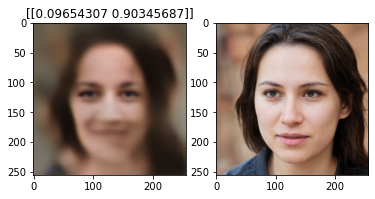

tf.Tensor(
[[[[0.21638733 0.30716074 0.22495319]
   [0.3233675  0.29581976 0.2475742 ]
   [0.3556941  0.30677536 0.27616996]
   ...
   [0.37949798 0.36217737 0.30327666]
   [0.37178776 0.36347428 0.29339638]
   [0.3838143  0.19191732 0.25268653]]

  [[0.31923848 0.34774432 0.2458366 ]
   [0.39528185 0.33542573 0.27393648]
   [0.4088726  0.33469233 0.28306076]
   ...
   [0.3966063  0.35347646 0.2985543 ]
   [0.41366193 0.3748965  0.30710295]
   [0.4026223  0.29311556 0.3176478 ]]

  [[0.3503958  0.3301134  0.2711222 ]
   [0.3996782  0.33052203 0.2776184 ]
   [0.39784876 0.32484797 0.30054286]
   ...
   [0.40772745 0.3546811  0.3158835 ]
   [0.41127643 0.3793053  0.31421688]
   [0.40238312 0.34971675 0.3187305 ]]

  ...

  [[0.50616306 0.4433668  0.37821433]
   [0.5356261  0.4477868  0.4220002 ]
   [0.5151901  0.4466932  0.40610823]
   ...
   [0.19996893 0.1489308  0.09897455]
   [0.21190953 0.15529573 0.10571435]
   [0.19117615 0.1155149  0.09474368]]

  [[0.49577168 0.34327072 0.391427

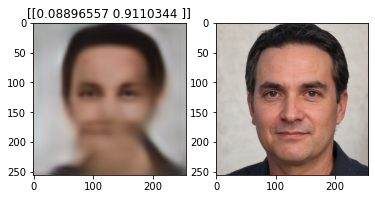

tf.Tensor(
[[[[0.41155136 0.6139084  0.5259092 ]
   [0.5867378  0.61706835 0.6049016 ]
   [0.64058906 0.616627   0.6604784 ]
   ...
   [0.6540408  0.6636833  0.6135189 ]
   [0.64095837 0.6377256  0.586695  ]
   [0.65440613 0.30937275 0.49367964]]

  [[0.6163615  0.65316993 0.57234496]
   [0.70724016 0.656724   0.6764613 ]
   [0.71180546 0.6224356  0.7024857 ]
   ...
   [0.6326313  0.61930376 0.6202143 ]
   [0.6315179  0.6557019  0.62197155]
   [0.6474274  0.5094436  0.60331947]]

  [[0.66119    0.5862698  0.5867501 ]
   [0.69073886 0.633823   0.6395947 ]
   [0.67029023 0.6047582  0.6929642 ]
   ...
   [0.6847541  0.66135466 0.67201954]
   [0.6595046  0.6901257  0.65579176]
   [0.64067894 0.64178413 0.6163068 ]]

  ...

  [[0.7457534  0.64445025 0.58616906]
   [0.7721249  0.65855044 0.65063626]
   [0.7328319  0.6547335  0.6315495 ]
   ...
   [0.35634172 0.3039709  0.27466485]
   [0.35781202 0.313099   0.27523446]
   [0.31599885 0.2979334  0.23266836]]

  [[0.7258288  0.49881005 0.610249

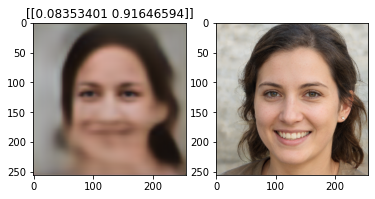

tf.Tensor(
[[[[0.3524588  0.51838726 0.4314953 ]
   [0.50527906 0.5181319  0.49247357]
   [0.55198526 0.51887476 0.54072034]
   ...
   [0.5443779  0.5397976  0.49130315]
   [0.53286254 0.5211997  0.46676525]
   [0.5426175  0.26002884 0.39483246]]

  [[0.5252717  0.56053764 0.47074333]
   [0.6104647  0.5564727  0.54915786]
   [0.62056714 0.5348143  0.56968045]
   ...
   [0.5390492  0.5160044  0.49207577]
   [0.54699016 0.54234344 0.49344748]
   [0.54878795 0.42057115 0.48645523]]

  [[0.5654594  0.51244205 0.48902702]
   [0.6047298  0.5434706  0.51992524]
   [0.5913572  0.51735514 0.5678733 ]
   ...
   [0.57413584 0.5420486  0.53303427]
   [0.5578296  0.57052827 0.51607096]
   [0.54295355 0.52422804 0.4966643 ]]

  ...

  [[0.5900994  0.5115148  0.449572  ]
   [0.6166655  0.5185508  0.4992132 ]
   [0.58767927 0.5178013  0.48110816]
   ...
   [0.45735383 0.33356202 0.30383712]
   [0.4400231  0.3446887  0.29944438]
   [0.3821097  0.30580342 0.2589524 ]]

  [[0.5742033  0.39502454 0.464607

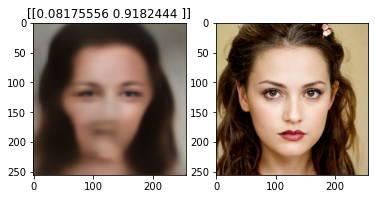

tf.Tensor(
[[[[0.3415518  0.49671015 0.40894967]
   [0.48965636 0.49622396 0.4654996 ]
   [0.5346043  0.49743056 0.5116871 ]
   ...
   [0.43267828 0.42080873 0.36795133]
   [0.42493302 0.41499978 0.3517381 ]
   [0.4373335  0.21635744 0.3020606 ]]

  [[0.5093267  0.5392373  0.44681585]
   [0.5956742  0.53318155 0.52066153]
   [0.6063912  0.51517    0.5398189 ]
   ...
   [0.43972188 0.40607762 0.36215305]
   [0.45697144 0.42964563 0.36594012]
   [0.45014256 0.33568698 0.3744109 ]]

  [[0.55028415 0.495204   0.466654  ]
   [0.5919869  0.5233231  0.49588487]
   [0.57893753 0.49964353 0.54051816]
   ...
   [0.45786425 0.41371483 0.3883413 ]
   [0.45345086 0.4405559  0.37934706]
   [0.44636387 0.40661746 0.37708613]]

  ...

  [[0.3137731  0.25384837 0.20169894]
   [0.34099054 0.26758677 0.23009868]
   [0.33524197 0.26628911 0.21624808]
   ...
   [0.6468812  0.5405573  0.5456038 ]
   [0.61969566 0.54102874 0.5302235 ]
   [0.54305357 0.5082085  0.4362021 ]]

  [[0.3059386  0.19993371 0.203484

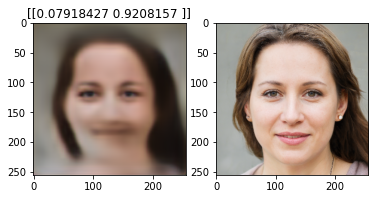

tf.Tensor(
[[[[0.25243145 0.35961464 0.27534625]
   [0.36945444 0.35012496 0.30589503]
   [0.4027744  0.35655543 0.33844393]
   ...
   [0.4147271  0.4014566  0.34847313]
   [0.40732953 0.39770323 0.33397752]
   [0.4199544  0.2085791  0.2877747 ]]

  [[0.37115878 0.4039377  0.30198857]
   [0.4488705  0.38769463 0.33999184]
   [0.46087724 0.38315916 0.34951922]
   ...
   [0.42558002 0.391052   0.3431958 ]
   [0.4443495  0.41397598 0.34864482]
   [0.43676022 0.3230319  0.35882425]]

  [[0.40375963 0.38048998 0.32700706]
   [0.4519631  0.38444465 0.33547348]
   [0.4490263  0.3710568  0.3639381 ]
   ...
   [0.4432082  0.3987462  0.3690495 ]
   [0.4416885  0.4253135  0.36228085]
   [0.43461087 0.3911684  0.36285767]]

  ...

  [[0.626813   0.5546397  0.49236384]
   [0.66504884 0.574115   0.55076855]
   [0.6488167  0.5736083  0.5450683 ]
   ...
   [0.3613762  0.27421072 0.24319938]
   [0.35445815 0.2783813  0.23937155]
   [0.30744296 0.22372039 0.20126769]]

  [[0.61449987 0.42913455 0.512735

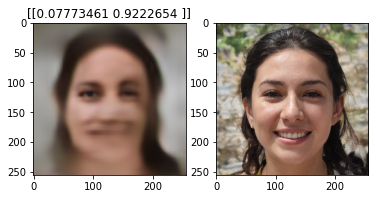

tf.Tensor(
[[[[0.24274045 0.34718937 0.26313055]
   [0.3571705  0.33729097 0.29159525]
   [0.3907045  0.3447532  0.32347953]
   ...
   [0.5319377  0.5354732  0.4820872 ]
   [0.52551025 0.5217939  0.4640607 ]
   [0.54011    0.26057243 0.39595276]]

  [[0.3572288  0.3914734  0.28898326]
   [0.43397233 0.37631384 0.32378337]
   [0.44713983 0.37224326 0.33379614]
   ...
   [0.52525496 0.50365275 0.4834706 ]
   [0.53481203 0.53586304 0.48901093]
   [0.5434048  0.4188691  0.48724777]]

  [[0.38938984 0.3699966  0.31439233]
   [0.43806434 0.37308383 0.32167894]
   [0.43715727 0.3611273  0.34968293]
   ...
   [0.5647254  0.53157306 0.5280905 ]
   [0.55120087 0.56111336 0.5166186 ]
   [0.53896    0.52207834 0.49741063]]

  ...

  [[0.561477   0.4881526  0.4204658 ]
   [0.5938102  0.49581894 0.46701083]
   [0.5733361  0.49555779 0.4528017 ]
   ...
   [0.3996674  0.31464356 0.27270034]
   [0.3911621  0.3275261  0.27433518]
   [0.33909467 0.3109737  0.24143328]]

  [[0.55039215 0.3775206  0.436698

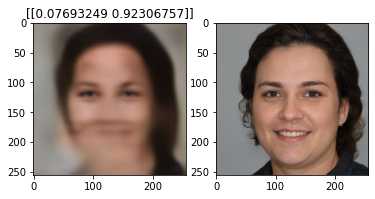

tf.Tensor(
[[[[0.34791484 0.50996625 0.42035007]
   [0.49721932 0.5079891  0.4773234 ]
   [0.5415835  0.50714415 0.5223698 ]
   ...
   [0.44678447 0.4303145  0.38169032]
   [0.43543553 0.4211031  0.36172208]
   [0.44414797 0.21756355 0.30682874]]

  [[0.51939255 0.55352366 0.46032023]
   [0.60371625 0.54372555 0.53204405]
   [0.613304   0.52341014 0.5474277 ]
   ...
   [0.4540562  0.42002454 0.37468413]
   [0.46857634 0.43987375 0.3768504 ]
   [0.4578352  0.34111583 0.38001326]]

  [[0.5611347  0.5090576  0.48151857]
   [0.6013174  0.5363379  0.5071231 ]
   [0.58835536 0.50971824 0.55054545]
   ...
   [0.46950325 0.42700303 0.39984196]
   [0.46296248 0.45288336 0.38726136]
   [0.4532155  0.4133224  0.38307977]]

  ...

  [[0.62470764 0.5412589  0.4784077 ]
   [0.6557111  0.5523566  0.5315911 ]
   [0.62851566 0.5521153  0.5179927 ]
   ...
   [0.2520474  0.20408094 0.14015658]
   [0.26819438 0.218964   0.15967095]
   [0.23197812 0.20919217 0.14441401]]

  [[0.6084657  0.4181254  0.495752

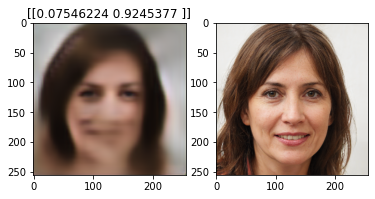

tf.Tensor(
[[[[0.42759767 0.64160573 0.5535972 ]
   [0.6089851  0.6450563  0.63815707]
   [0.66361976 0.643917   0.69626224]
   ...
   [0.5910339  0.5944806  0.5437659 ]
   [0.5802887  0.5742887  0.51995075]
   [0.5928431  0.2828082  0.43990135]]

  [[0.64103025 0.6803458  0.60145056]
   [0.7314352  0.68482906 0.7113813 ]
   [0.7328397  0.64666635 0.7381403 ]
   ...
   [0.57894534 0.56052893 0.54739934]
   [0.5831739  0.5928431  0.5501036 ]
   [0.5934142  0.46078438 0.5399409 ]]

  [[0.686582   0.60818017 0.61506426]
   [0.71296    0.6591628  0.67245317]
   [0.6903927  0.6275525  0.7275224 ]
   ...
   [0.62448263 0.59497684 0.59591335]
   [0.6039375  0.624339   0.57973534]
   [0.5881656  0.57816136 0.5523455 ]]

  ...

  [[0.50701416 0.42473686 0.3473498 ]
   [0.5480479  0.42962247 0.38329256]
   [0.53741    0.43555367 0.3758806 ]
   ...
   [0.67373735 0.5982283  0.61177415]
   [0.64233726 0.576443   0.5820898 ]
   [0.55816966 0.52704674 0.46468434]]

  [[0.5000817  0.32819903 0.362094

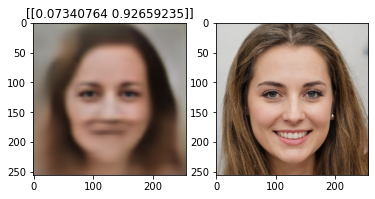

tf.Tensor(
[[[[0.37737188 0.55730194 0.4689911 ]
   [0.53835607 0.55727345 0.5363021 ]
   [0.5864938  0.55588156 0.5854295 ]
   ...
   [0.55908    0.55741    0.5051377 ]
   [0.54740125 0.5383144  0.4802509 ]
   [0.5584144  0.2681211  0.4067588 ]]

  [[0.56416667 0.5988052  0.51144826]
   [0.6500485  0.5949597  0.5982202 ]
   [0.6563768  0.56728595 0.61763406]
   ...
   [0.5524839  0.52899325 0.5053196 ]
   [0.5592915  0.55661595 0.50643134]
   [0.5626168  0.43260702 0.5000856 ]]

  [[0.6074319  0.5439212  0.5293019 ]
   [0.6421745  0.57936937 0.5667453 ]
   [0.6234294  0.55251855 0.6154054 ]
   ...
   [0.5880518  0.5537432  0.5462385 ]
   [0.5711513  0.5825281  0.5291178 ]
   [0.55693126 0.5376451  0.50934494]]

  ...

  [[0.5662047  0.46766794 0.39281312]
   [0.604009   0.47387156 0.43523648]
   [0.5831876  0.48004466 0.42658806]
   ...
   [0.45737687 0.3287437  0.29259422]
   [0.4404089  0.34076753 0.29056624]
   [0.37989554 0.30346096 0.2526778 ]]

  [[0.5532361  0.3607036  0.407736

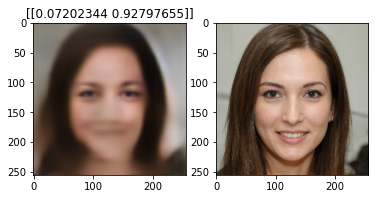

tf.Tensor(
[[[[0.3079783  0.44818366 0.36009237]
   [0.44298986 0.4431546  0.40558183]
   [0.48079497 0.4429397  0.4461905 ]
   ...
   [0.49427336 0.48902395 0.43506965]
   [0.4850644  0.4763178  0.4147017 ]
   [0.49740174 0.24220517 0.3543642 ]]

  [[0.45641458 0.49362892 0.3953754 ]
   [0.5366341  0.47838244 0.45043907]
   [0.547474   0.4651978  0.46237177]
   ...
   [0.4958594  0.4678021  0.43196595]
   [0.5090272  0.4933022  0.43515608]
   [0.5078887  0.38438788 0.4376927 ]]

  [[0.49258405 0.45923507 0.4207201 ]
   [0.5381196  0.47707877 0.43439358]
   [0.5319     0.45076138 0.47215757]
   ...
   [0.5241907  0.48486316 0.4682302 ]
   [0.51416725 0.51365614 0.45494616]
   [0.50427765 0.47398928 0.4452353 ]]

  ...

  [[0.41673914 0.33158663 0.28239805]
   [0.43792707 0.3420006  0.3209884 ]
   [0.41135824 0.34632602 0.30261526]
   ...
   [0.2463704  0.18420781 0.13580641]
   [0.24918249 0.19429298 0.13795859]
   [0.22308421 0.15800083 0.1263356 ]]

  [[0.39656207 0.2573739  0.282439

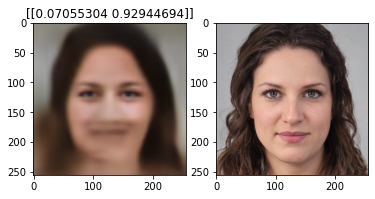

tf.Tensor(
[[[[0.32837725 0.48050714 0.3914261 ]
   [0.47092372 0.4770182  0.44266883]
   [0.51222456 0.47667637 0.4857526 ]
   ...
   [0.45264837 0.443047   0.3903836 ]
   [0.44425204 0.43432617 0.37226754]
   [0.45654753 0.2244581  0.31955323]]

  [[0.48832032 0.5252323  0.4290986 ]
   [0.57106805 0.5122704  0.4921495 ]
   [0.58150554 0.49563366 0.5057293 ]
   ...
   [0.45883912 0.42760047 0.38580975]
   [0.47547248 0.45163476 0.3896621 ]
   [0.47049075 0.3519889  0.39627662]]

  [[0.5272291  0.4855978  0.4525432 ]
   [0.57047683 0.5086043  0.4714827 ]
   [0.5617244  0.48139265 0.5121646 ]
   ...
   [0.481715   0.4399241  0.41695163]
   [0.47559613 0.46811673 0.40650377]
   [0.46753356 0.43063766 0.40226418]]

  ...

  [[0.4749051  0.3868004  0.31857318]
   [0.51002395 0.3927868  0.35433027]
   [0.49267727 0.39766484 0.34437934]
   ...
   [0.34375826 0.23012513 0.17944975]
   [0.33480918 0.24458708 0.18111928]
   [0.28600755 0.20695703 0.16536233]]

  [[0.46391338 0.298568   0.328728

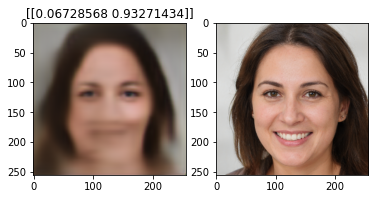

tf.Tensor(
[[[[0.3566489  0.52421075 0.43571588]
   [0.5098302  0.52358675 0.49678123]
   [0.5562375  0.52314824 0.5440977 ]
   ...
   [0.49396765 0.48771575 0.4350794 ]
   [0.48454204 0.47468114 0.41415983]
   [0.49611443 0.24134909 0.35306263]]

  [[0.5330009  0.5668254  0.47611317]
   [0.61756396 0.5606902  0.5537585 ]
   [0.62713355 0.5382779  0.5721187 ]
   ...
   [0.49469182 0.46677047 0.43163455]
   [0.5075929  0.4915382  0.4342251 ]
   [0.50558645 0.38297    0.43562105]]

  [[0.57506496 0.5192131  0.49517295]
   [0.6137653  0.5496455  0.5251023 ]
   [0.59960353 0.5231821  0.5722558 ]
   ...
   [0.52126825 0.48299855 0.46639362]
   [0.5113721  0.5112551  0.45279   ]
   [0.50112784 0.4717283  0.44228548]]

  ...

  [[0.24601433 0.20714186 0.14982274]
   [0.27666742 0.21815707 0.17020915]
   [0.2835122  0.21626487 0.16197994]
   ...
   [0.66806006 0.5741639  0.580365  ]
   [0.6391788  0.5707905  0.5623068 ]
   [0.5612215  0.53109986 0.45765823]]

  [[0.24531823 0.16478936 0.153931

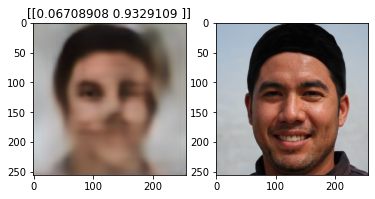

tf.Tensor(
[[[[0.40826246 0.60900825 0.5199816 ]
   [0.581918   0.61207086 0.5973601 ]
   [0.63615894 0.6116338  0.65213215]
   ...
   [0.62982494 0.63292074 0.58651555]
   [0.6156985  0.6075756  0.5577063 ]
   [0.62606925 0.2961592  0.4682191 ]]

  [[0.6115852  0.64905125 0.56610197]
   [0.7022209  0.65077025 0.6668067 ]
   [0.70912516 0.6179687  0.69152826]
   ...
   [0.61277467 0.5967863  0.5900991 ]
   [0.6124605  0.6286416  0.59090036]
   [0.6225952  0.4866445  0.5731738 ]]

  [[0.6567386  0.58406925 0.58056945]
   [0.6878833  0.6303295  0.6292756 ]
   [0.66933316 0.6016983  0.68321395]
   ...
   [0.6588786  0.6335948  0.6379903 ]
   [0.63423353 0.6621033  0.61974627]
   [0.6155731  0.6115727  0.58535737]]

  ...

  [[0.74187684 0.6345092  0.5766187 ]
   [0.7658651  0.64739305 0.6396882 ]
   [0.7234093  0.6454845  0.61923224]
   ...
   [0.64754784 0.60874695 0.6230985 ]
   [0.62777853 0.5809597  0.5935504 ]
   [0.54829556 0.5353124  0.4683695 ]]

  [[0.71983343 0.48996902 0.598370

In [38]:
for iter in range(20):

    if vals[iter] < len(train_image):
        plt.figure()
        plt.subplot(1,2,1)
        plt.imshow(tf.squeeze(editor(tf.reshape(gen_images[vals[iter]],(-1,256,256,3))) ))
        plt.title(preds[vals[iter]])
        plt.subplot(1,2,2)
        plt.imshow(train_image[vals[iter]])
        plt.show()
    print(editor(tf.reshape(gen_images[vals[iter]],(-1,256,256,3))))

In [39]:
if False:
    mask_array_edit_tr,mask_array_edit_te,mask_array_edit = edit_images(mask_array)
    for iter in range(10): 
        model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-6), loss = psnrLoss,
                  metrics = ['acc'])
        model.fit(mask_array_edit_tr, train_image, epochs = 5,shuffle='True',validation_split = 0.2)
        
        model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-6), loss = discLoss,
                     metrics = ['acc'])
        model.fit(mask_array_edit_tr, train_image, epochs = 5,shuffle='True',validation_split = 0.2, 
                  batch_size=16)
        
        model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-5), loss = 'mse',
                  metrics = ['acc'])
        model.fit(mask_array_edit_tr, train_image, epochs = 5,validation_split = 0.2,shuffle='True')
        plot_images(50,55)
    plot_images(20,30)

## plotting images

In [40]:
def plot_images(start = 0, end = 5):
    for i in range(start, end, 1):
        plt.figure(figsize = (10,10))
        plt.subplot(1,3,1)
        plt.title("No Mask", fontsize = 12)
        plt.imshow(test_image[i])
        plt.subplot(1,3,2)
        plt.title("Mask", fontsize = 12)
        plt.imshow(test_mask_image[i])
        plt.subplot(1,3,3)
        plt.title("Predicted", fontsize = 12)
        prediction = model.predict(test_mask_image[i].reshape(1,SIZE, SIZE, 3)).reshape(SIZE, SIZE, 3)
        plt.imshow(prediction)
        plt.show()
        

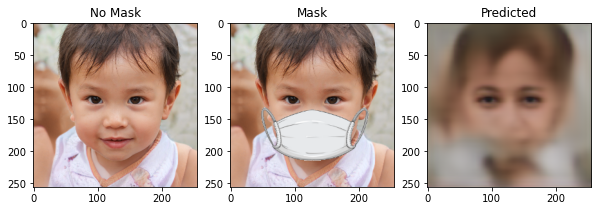

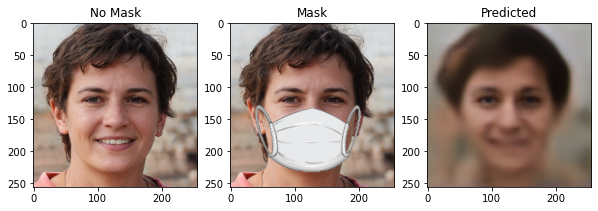

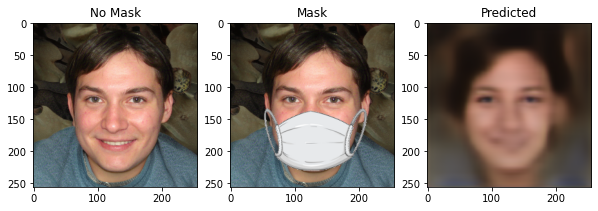

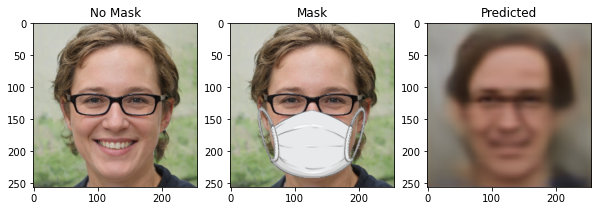

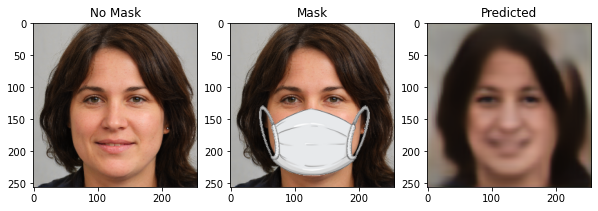

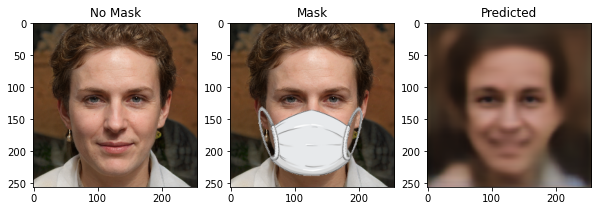

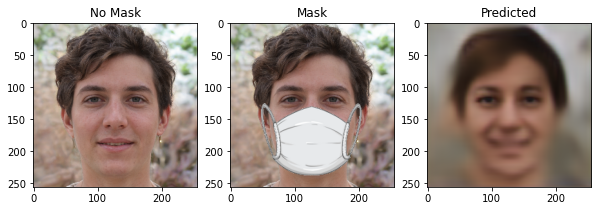

In [41]:
plot_images(5,12)

In [42]:

'''
mask_path = '../input/toker2/'
mask_array = []


mask_file = sorted_alphanumeric(os.listdir(mask_path))
for i in tqdm(mask_file):
    image = cv2.imread(mask_path + '/' + i,1)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (SIZE, SIZE))
    image = image.astype('float32') / 255.0
    mask_array.append(img_to_array(image))
    
'''


"\nmask_path = '../input/toker2/'\nmask_array = []\n\n\nmask_file = sorted_alphanumeric(os.listdir(mask_path))\nfor i in tqdm(mask_file):\n    image = cv2.imread(mask_path + '/' + i,1)\n    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)\n    image = cv2.resize(image, (SIZE, SIZE))\n    image = image.astype('float32') / 255.0\n    mask_array.append(img_to_array(image))\n    \n"

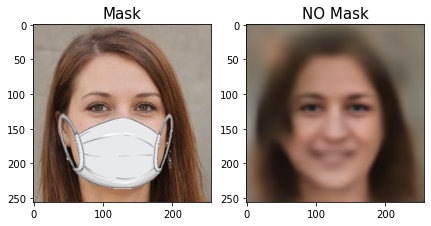

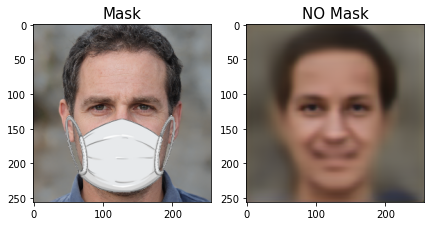

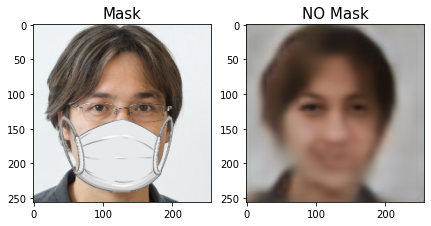

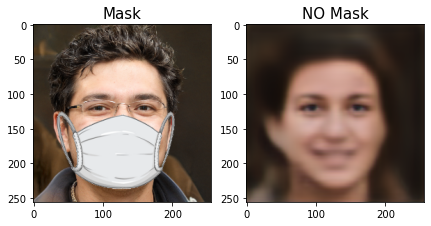

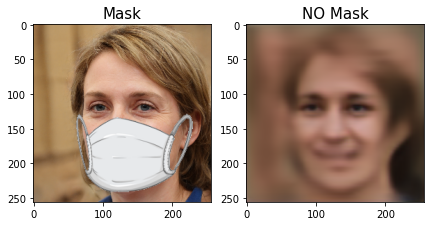

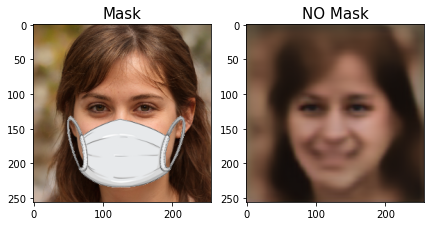

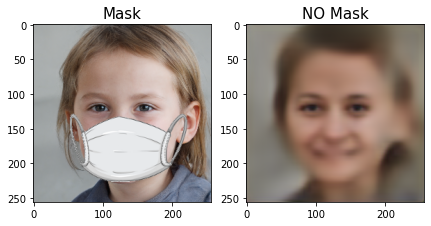

In [43]:
def plot_image_pair(images = 1):
    for i in range(images):
        plt.figure(figsize = (7,7))
        plt.subplot(1,2,1)
        plt.title("Mask", fontsize = 15)
        plt.imshow(mask_array[i].reshape(SIZE, SIZE, 3))
        plt.subplot(1,2,2)
        plt.title("NO Mask", fontsize = 15)
        plt.imshow(model.predict(mask_array[i].reshape(1,SIZE, SIZE, 3)).reshape(SIZE, SIZE, 3))

        
        
        
plot_image_pair(7)

In [44]:
if 0:
    import os
    os.chdir(r'/kaggle/working/comps')
    print(os.listdir())
    import shutil
    shutil.make_archive('comparison', 'zip', os.getcwd())

In [45]:
if  0: 
    from IPython.display import FileLink
    FileLink(r'./comparison.zip')

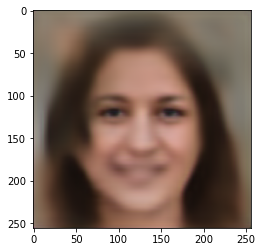

In [46]:
prediction = model.predict(mask_array[0].reshape(1,SIZE, SIZE, 3)).reshape(SIZE, SIZE, 3)
plt.imshow(prediction)

# Thanks for your visit